In [83]:
import numpy as np
import pandas as pd
from pandas.plotting import table
import cv2 as cv 
import math
import scipy.stats as stats
from scipy.stats import norm
import seaborn as sns


from google.colab.patches import cv2_imshow # for image display
from skimage import io
import csv
from PIL import Image 
import matplotlib.pylab as plt
from matplotlib.pyplot import imshow
import matplotlib.image as mpimg 
from matplotlib import colors

#Load the images from github

In [84]:
## URL to Hillshade Grimsel omni (with 2 m scale)
url_hillshade_omni = 'https://github.com/stfabbri/CAS_thesis/blob/main/DEMs%20and%20Hillshades/HillSha2m_omni.jpg?raw=true'
## URL to DEM
url_dem = 'https://raw.githubusercontent.com/stfabbri/CAS_thesis/main/DEMs%20and%20Hillshades/dem.csv'

In [85]:
from PIL import Image
import urllib.request


with urllib.request.urlopen(url_hillshade_omni) as url:
    with open('Hillshade2m_omni.jpg', 'wb') as f:
        f.write(url.read())

# Plot Image as Hillshade with pixel dimension

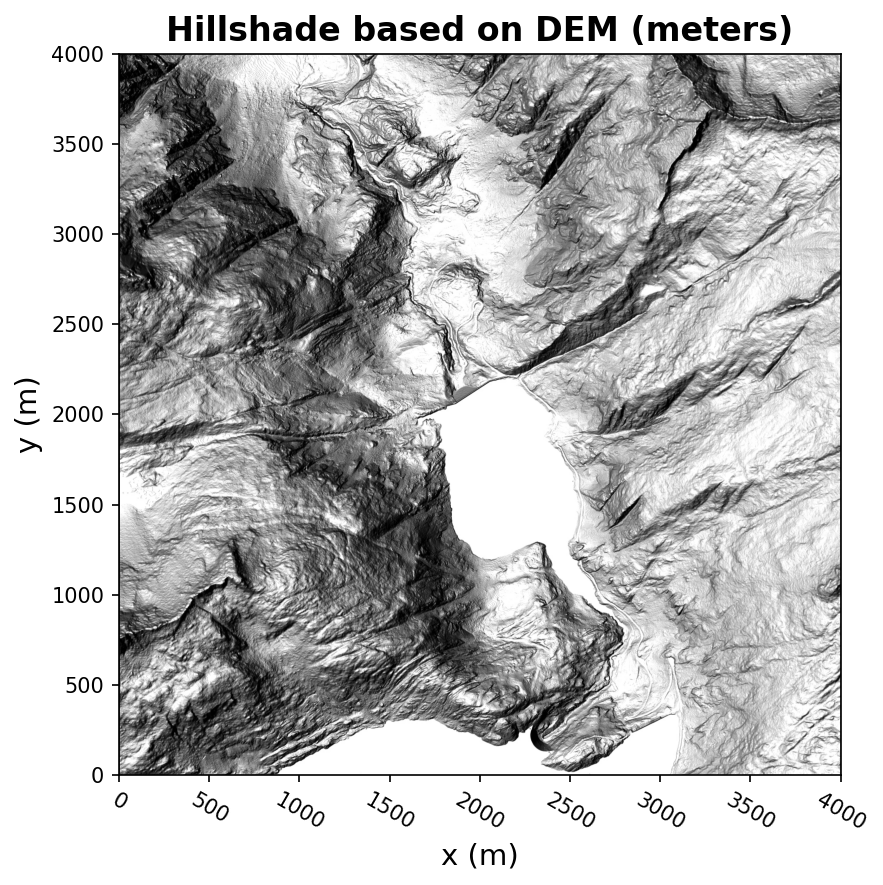

In [86]:
# Hillshade based on Digital elevation model (dem)
from matplotlib.pyplot import figure
figure(num=None, figsize=(8, 6), dpi=150, facecolor='w', edgecolor='k')

x, y     =  np.linspace(0,4000,2), np.linspace(0,4000,2)
xv, yv   =  np.meshgrid(x, y)

Hillsh_image = mpimg.imread('Hillshade2m_omni.jpg')

phys_coords = [0,4000,0,4000]

plt.imshow(Hillsh_image,extent=phys_coords)
#plt.imshow(df_dem,alpha=.5,cmap=cmap,extent=phys_coords)
plt.clim(500, 3000)

# labbels - everything in Meters
plt.xlabel('x (m)',size=14)
plt.ylabel('y (m)',size=14)
plt.xticks(np.arange(0, 4000+1, step=500),rotation='-30')
plt.yticks(np.arange(0, 4000+1, step=500),rotation='  0')
plt.title('Hillshade based on DEM (meters)',size=16,fontweight="bold")

plt.tight_layout()

Plot Image as Hillshade with pixel dimension

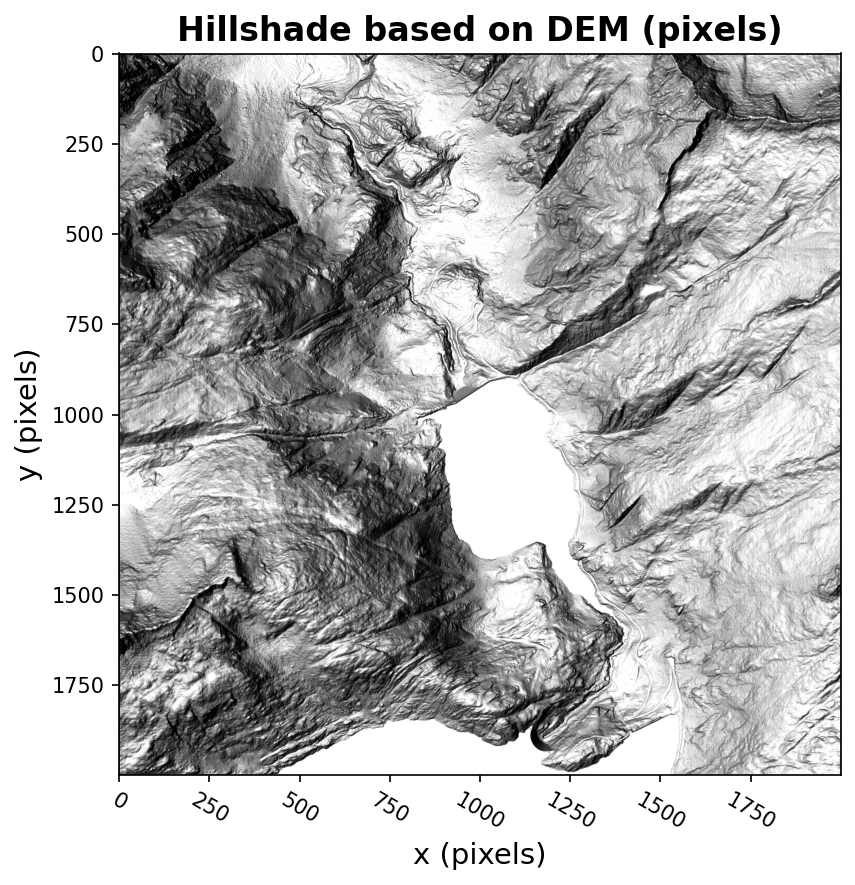

In [87]:

fig = plt.figure(figsize=(8,6), dpi=150)
testim = mpimg.imread('Hillshade2m_omni.jpg') # JPEG required, otherwise no color channels. Jpeg = uint8, png = float32 -> Problem

#plt.imshow(df_dem,alpha=.5,cmap=cmap,extent=phys_coords)
#plt.clim(500, 3000)
plt.xlabel('x (pixels)',size=14)
plt.ylabel('y (pixels)',size=14)
plt.xticks(np.arange(0, 2000+1, step=250),rotation='-30')
plt.yticks(np.arange(0, 2000+1, step=250),rotation='  0')
plt.title('Hillshade based on DEM (pixels)',size=16,fontweight="bold")
plt.tight_layout()
#figure(1)
imshow(testim)

#Display DEM and DEM  + Hillshade

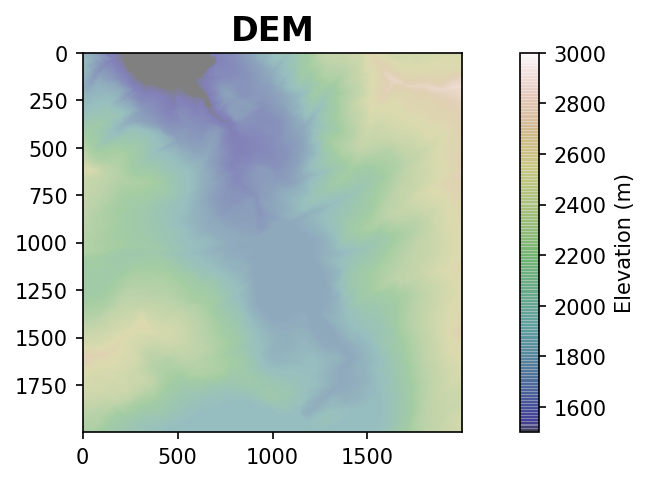

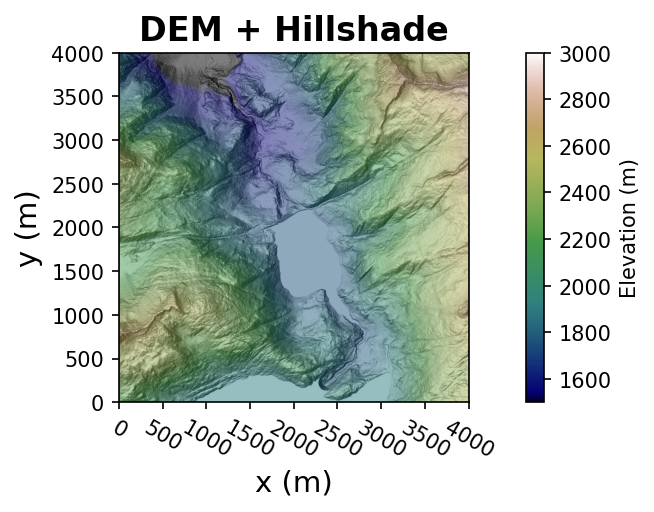

In [88]:
# Digital elevation model (dem)

dem    = pd.read_csv(url_dem,header=None)
df_dem = pd.DataFrame(dem)
cmap   = 'gist_earth'


figure(num=None, figsize=(8, 6), dpi=150, facecolor='w', edgecolor='k')
plt.subplot(211),plt.imshow(df_dem,alpha=.5,cmap=cmap)
plt.title('DEM',size=16,fontweight="bold")
# colorbar
cbar = plt.colorbar(label='Elevation (m)')
cbar.set_alpha(1)
cbar.draw_all()
plt.clim(1500, 3000)

plt.tight_layout()

##################### Plot both

figure(num=None, figsize=(8, 6), dpi=150, facecolor='w', edgecolor='k')
x, y     =  np.linspace(0,4000,2), np.linspace(0,4000,2)
xv, yv   =  np.meshgrid(x, y)

phys_coords = [0,4000,0,4000]

plt.subplot(212),
plt.imshow(Hillsh_image,extent=phys_coords)
plt.imshow(df_dem,alpha=.5,cmap=cmap,extent=phys_coords)
plt.clim(1500, 3000)

# colorbar
cbar = plt.colorbar(label='Elevation (m)')
cbar.set_alpha(1)
cbar.draw_all()

# labbels
plt.xlabel('x (m)',size=14)
plt.ylabel('y (m)',size=14)
plt.xticks(np.arange(0, 4000+1, step=500),rotation='-30')
plt.yticks(np.arange(0, 4000+1, step=500),rotation='  0')
plt.title('DEM + Hillshade',size=16,fontweight="bold")

plt.tight_layout()


Get data about the image (size, pixels, channels)

In [89]:
# Check the image matrix data type (could know the bit depth of the image)
print(testim.dtype)
# Check the height of image 
print(testim.shape[0])
# Check the width of image 
print(testim.shape[1])
# Check the number of channels of the image
print(testim.shape[2])

uint8
2000
2000
3


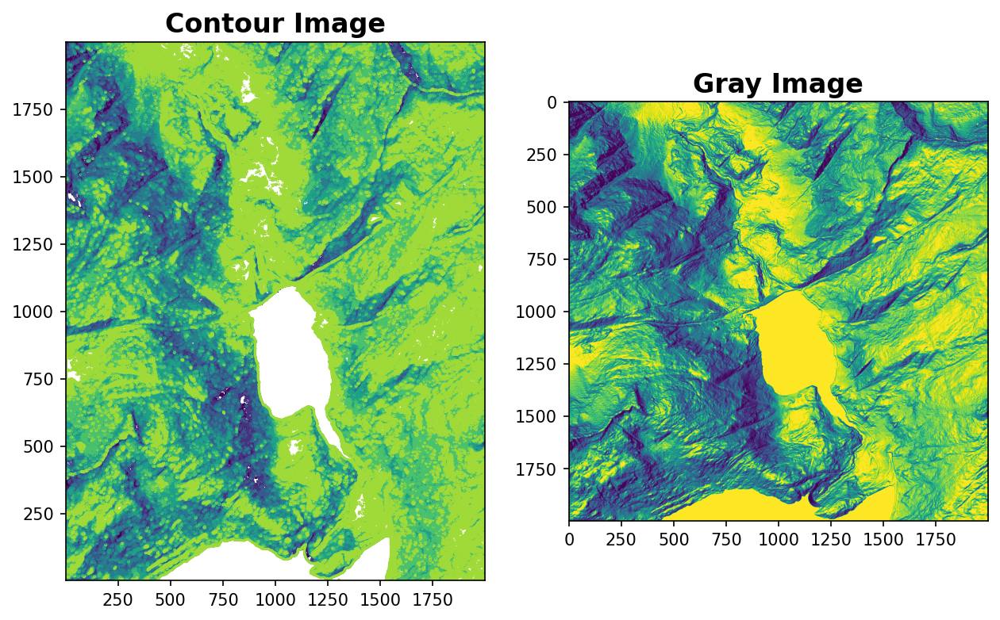

In [90]:
gray_image = cv.cvtColor(Hillsh_image, cv.COLOR_BGR2GRAY)
figure(num=None, figsize=(10, 6), dpi=150, facecolor='w', edgecolor='k')
plt.subplot(121),
plt.contour(gray_image, origin = "image")
plt.title('Contour Image',size=16,fontweight="bold")
#figure(num=None, figsize=(8, 6), dpi=150, facecolor='w', edgecolor='k')
plt.subplot(122),
plt.title('Gray Image',size=16,fontweight="bold")
plt.imshow(gray_image)

Text(0.5, 1.0, 'Gray Image - INVERSE')

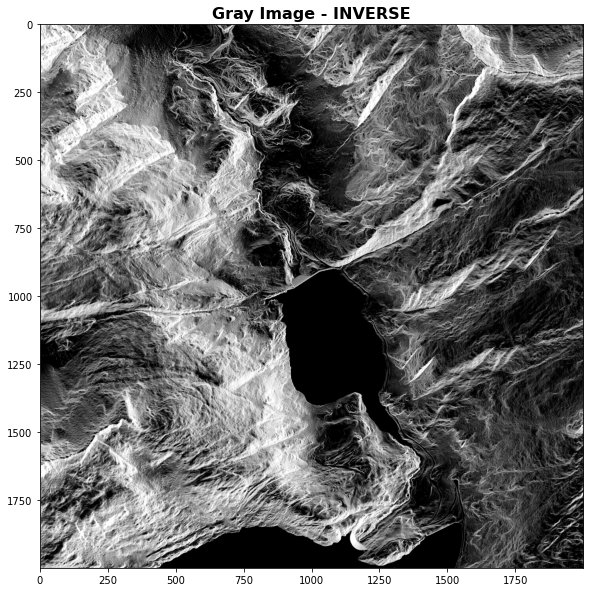

In [91]:
# This is an inverse operation of the grayscale image, you could see that the
# bright pixels become dark, and the dark pixels become bright
inv_gray = 255 - gray_image
#fig = plt.figure(figsize=(17,7))
fig = plt.figure(figsize=(10,10))
plt.imshow(inv_gray, cmap = 'gray')
plt.title('Gray Image - INVERSE',size=16,fontweight="bold")
#cv2_imshow(im2)   # -> Gives good contrast

## Filtered Image (output FFT)
A fourier transform is used to find the frequency domian of an image. You can consider an image as a signal which is sampled in two directions. So taking a fourier transform in both X and Y directions gives you the frequency representation of image. For the sinusoidal signal, if the amplitude varies so fast in short time, you can say it is a high frequency signal. If it varies slowly, it is a low frequency signal. Edges and noises are high frequency contents in an image because they change drastically in images.

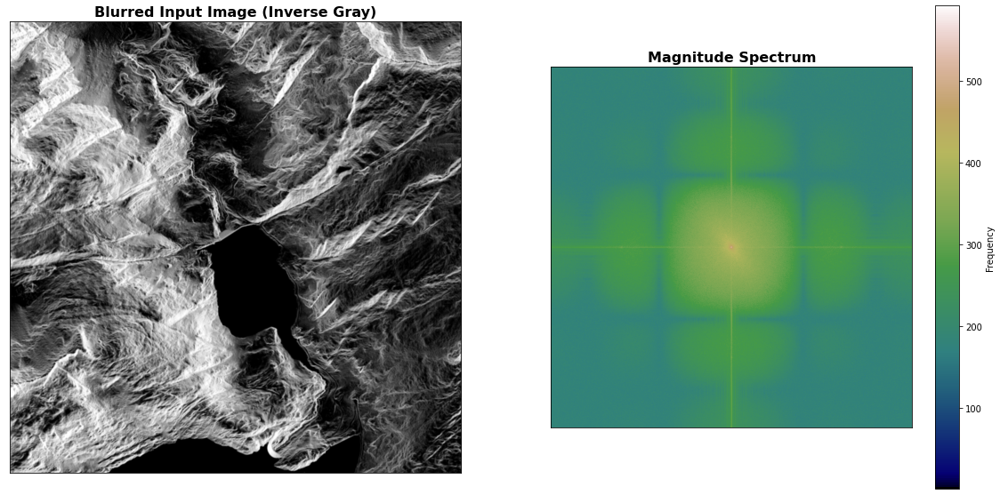

In [92]:
# Blur the grayscale image by a Guassian filter with kernel size of 10
imBlur = cv.blur(inv_gray,(5,5))
# Transform the image to frequency domain
f = np.fft.fft2(imBlur)
# Bring the zero-frequency component to the center
fshift = np.fft.fftshift(f)
magnitude_spectrum = 30*np.log(np.abs(fshift))

fig = plt.figure(figsize=(20,10))
plt.subplot(121),plt.imshow(imBlur, cmap = 'gray')
plt.title('Blurred Input Image (Inverse Gray)', size=16,fontweight="bold"), 
plt.xticks([]), plt.yticks([])
plt.subplot(122),
plt.imshow(magnitude_spectrum, cmap = 'gist_earth')
# colorbar
cbar = plt.colorbar(label='Frequency')
cbar.draw_all()
plt.title('Magnitude Spectrum', size=16,fontweight="bold"),
plt.xticks([]), plt.yticks([])
plt.show()

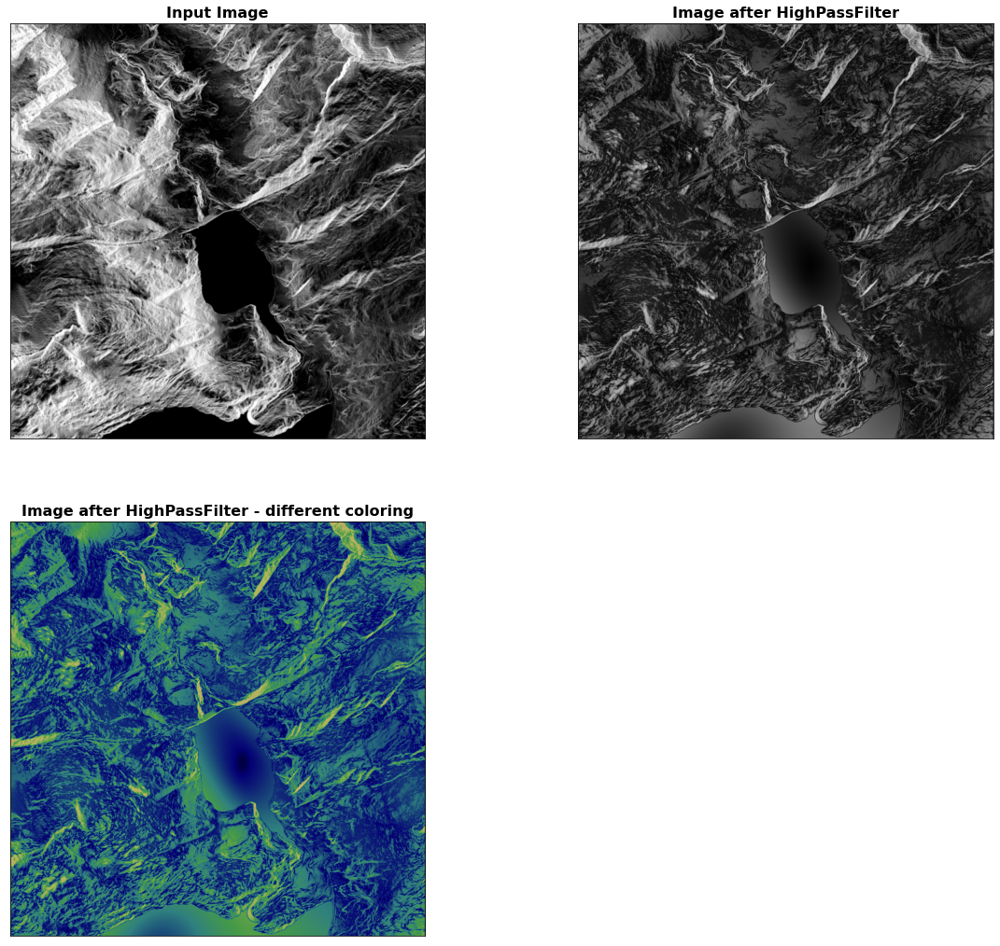

In [93]:
rows, cols = imBlur.shape
crow,ccol = round(rows/2) , round(cols/2)
# remove low frequencies with a rectangle size of 10
fshift[crow-3:crow+3, ccol-3:ccol+3] = 0
f_ishift = np.fft.ifftshift(fshift)
img_back = np.fft.ifft2(f_ishift)
img_back = np.abs(img_back)

plt.figure(figsize=([20, 18]))
plt.subplot(221),plt.imshow(imBlur, cmap = 'gray')
plt.title('Input Image', size=16,fontweight="bold"),
plt.xticks([]), plt.yticks([])
plt.subplot(222),plt.imshow(img_back, cmap = 'gray')
# High pass filter in FFT
plt.title('Image after HighPassFilter', size=16,fontweight="bold"), 
plt.xticks([]), plt.yticks([])
plt.subplot(223),plt.imshow(img_back, cmap = 'gist_earth')
plt.title('Image after HighPassFilter - different coloring', size=16,fontweight="bold"),
plt.xticks([]), plt.yticks([])
plt.show()

Text(0.5, 1.0, 'Blurred1515-INVERSE for better edge detection')

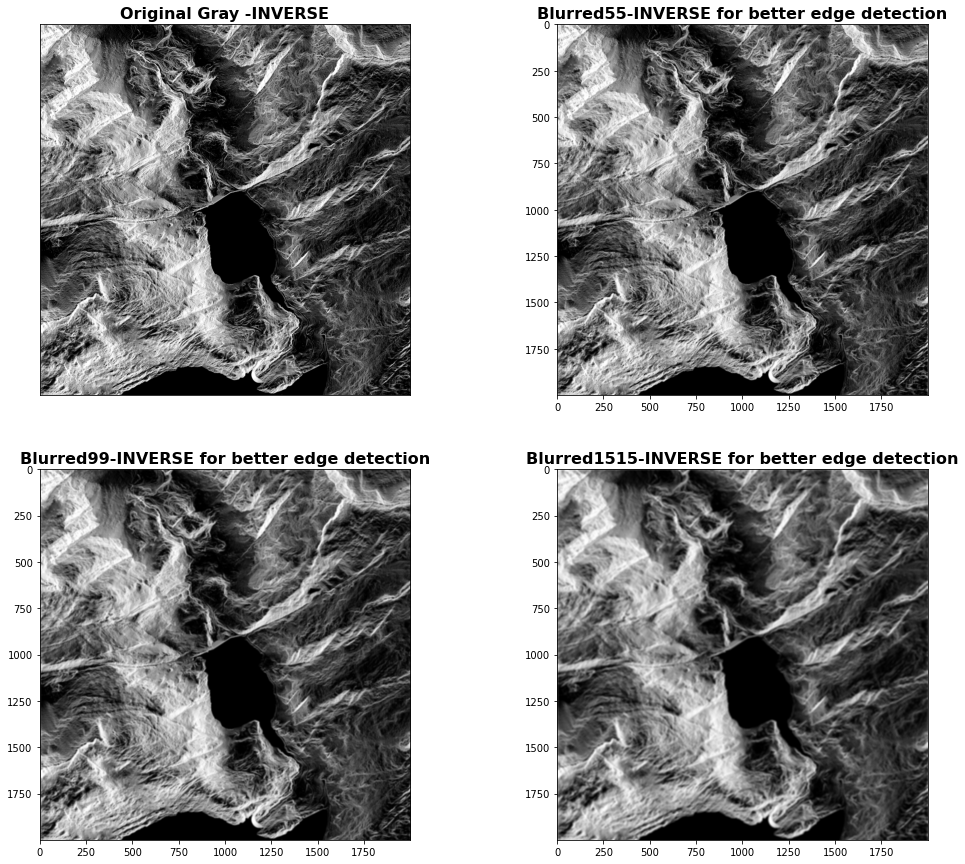

In [94]:
# Blur the image for better edge detection
#GaussianBlur(src, ksize, sigmaX[, dst[, sigmaY[, borderType]]]) -> dst
im_Blur55 = cv.GaussianBlur(inv_gray,(5,5),5)
im_Blur99 = cv.GaussianBlur(inv_gray,(9,9),5)
im_Blur1515 = cv.GaussianBlur(inv_gray,(15,15),5)
f, axs = plt.subplots(2,2,figsize=(17,15))
plt.subplot(221),plt.imshow(inv_gray, cmap = 'gray')
plt.title('Original Gray -INVERSE', size=16,fontweight="bold"),
plt.xticks([]), plt.yticks([])
plt.subplot(222),plt.imshow(im_Blur55, cmap = 'gray')
plt.title('Blurred55-INVERSE for better edge detection', size=16,fontweight="bold")
plt.subplot(223),plt.imshow(im_Blur99, cmap = 'gray')
plt.title('Blurred99-INVERSE for better edge detection', size=16,fontweight="bold")
plt.subplot(224),plt.imshow(im_Blur1515, cmap = 'gray')
plt.title('Blurred1515-INVERSE for better edge detection', size=16,fontweight="bold")


(([], <a list of 0 Text major ticklabel objects>),
 ([], <a list of 0 Text major ticklabel objects>))

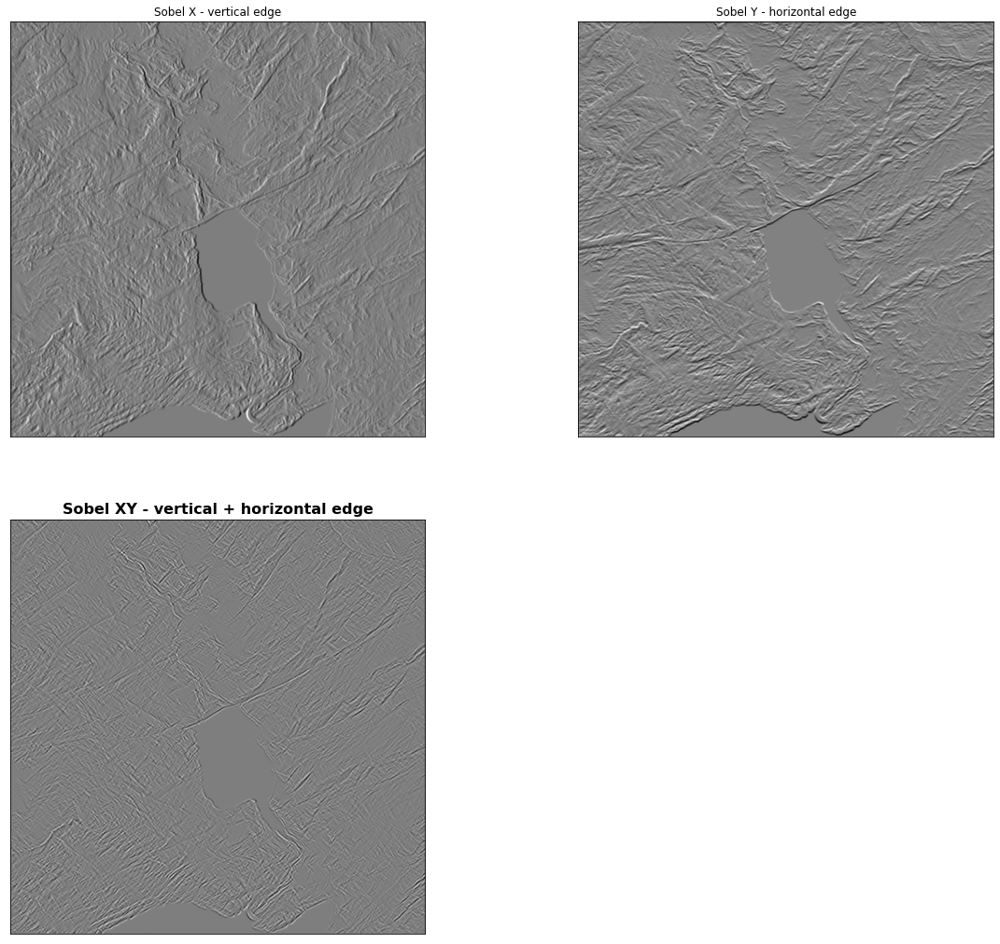

In [95]:
# Sobel Edge Detection
src=im_Blur99
sobelx = cv.Sobel(src, ddepth=cv.CV_64F, dx=1, dy=0, ksize=5) # Sobel Edge Detection on the X axis
sobely = cv.Sobel(src, ddepth=cv.CV_64F, dx=0, dy=1, ksize=5) # Sobel Edge Detection on the Y axis
sobelxy = cv.Sobel(src, ddepth=cv.CV_64F, dx=1, dy=1, ksize=5) # Combined X and Y Sobel Edge Detection
# Display Sobel Edge Detection Images
plt.figure(figsize=([20, 18]))
plt.subplot(221),plt.imshow(sobelx, cmap = 'gray')
plt.title('Sobel X - vertical edge'), 
plt.xticks([]), plt.yticks([])
plt.subplot(222),plt.imshow(sobely, cmap = 'gray')
plt.title('Sobel Y - horizontal edge'), 
plt.xticks([]), plt.yticks([])
plt.subplot(223),plt.imshow(sobelxy, cmap = 'gray')
plt.title('Sobel XY - vertical + horizontal edge', size=16,fontweight="bold"), 
plt.xticks([]), plt.yticks([])

#Plot Gradient Magnitude from SOBEL

In [96]:
gradient_magnitude = np.sqrt(np.square(sobelx) + np.square(sobely))

#gradient_magnitude= 255.0/gradient_magnitude.max()

#plt.imshow(gradient_magnitude, cmap='gray')
#plt.title("Gradient Magnitude")
plt.figure(figsize=([20, 18]))
imshow(gradient_magnitude)
#plt.subplot(111),plt.imshow(gradient_magnitude)

Output hidden; open in https://colab.research.google.com to view.

In [97]:
sobelxy_unit8 = (sobelxy*255).astype(np.uint8)
sobelxy_blur = cv.GaussianBlur(sobelxy_unit8,(9,9),5)

In [98]:
gradient_unit8 = (gradient_magnitude*255).astype(np.uint8)
gradient_blur = cv.GaussianBlur(gradient_unit8,(9,9),5)

In [99]:
gradient_blur = cv.GaussianBlur(gradient_unit8,(9,9),5)

In [100]:
#edges = cv2.Canny(gray,50,150,apertureSize = 3)

# threshold1  =1 -> leads to many many small edges
# threshold1 =150 -> leads to many many small edges

# threshold2=20 -> leads to many many small edges
# threshold2=300 -> leads to very few edges
#--------------------------------------------------------------  NEEDS to be optimzed
### ORIGIONAL IMAGE
image1 = Hillsh_image # HAS TO BE UNIT8 format and numpy.narray
threshold1=80     #PLAY WITH THIS Parameter for optimal results
threshold2=500    #PLAY WITH THIS Parameter for optimal results

### BLURRED IMAGE 55 Kernel
image2 = im_Blur55 # HAS TO BE UNIT8 format and numpy.narray
threshold1=50     #PLAY WITH THIS Parameter for optimal results
threshold2=500    #PLAY WITH THIS Parameter for optimal results

### BLURRED IMAGE 99 Kernel
image3 = im_Blur99 # HAS TO BE UNIT8 format and numpy.narray
threshold1=100     #PLAY WITH THIS Parameter for optimal results
threshold2=250   #PLAY WITH THIS Parameter for optimal results

### BLURRED IMAGE 1515 Kernel
image4 = im_Blur1515 # HAS TO BE UNIT8 format and numpy.narray
threshold1=8     #PLAY WITH THIS Parameter for optimal results
threshold2=180    #PLAY WITH THIS Parameter for optimal results

-1

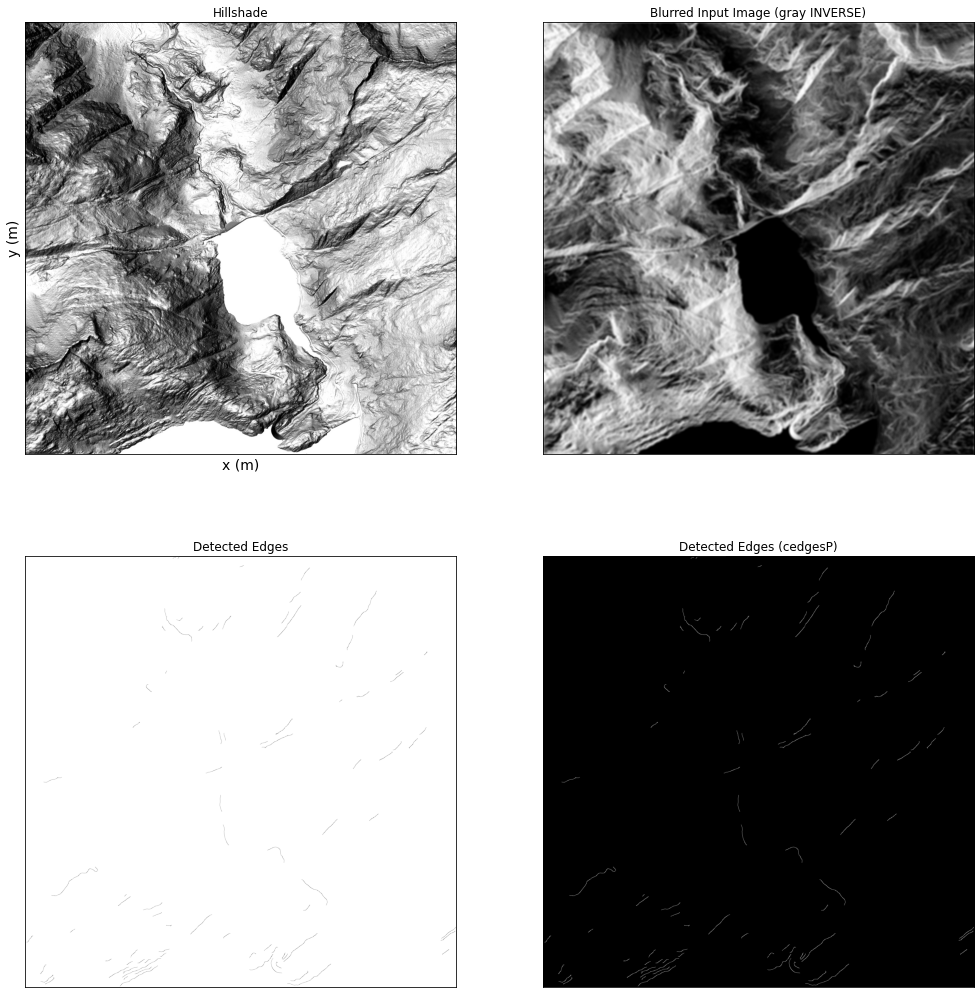

In [101]:
image=image4   #### CHOOSE HERE WHICH Filter considered for Canny INPUT: image1, image2, image3, image4

edges = cv.Canny(image=image, threshold1=threshold1, threshold2=threshold2) # Canny Edge Detection


# Copy edges to the images that will display the results in BGR
cedges = cv.cvtColor(edges, cv.COLOR_GRAY2BGR)
cedgesP = np.copy(cedges) # Inverse color
# Display Canny Edge Detection Image
#f, axs = plt.subplots(2,1,figsize=(30,20))


#df_lin = pd.DataFrame(cedges, columns = ['x1','y1','x2','y2'])


#plt.subplot(211)
fig = plt.subplots(2,2,figsize=(17,18))
plt.subplot(221),plt.imshow(Hillsh_image,extent=phys_coords)
plt.clim(500, 3000)
plt.xlabel('x (m)',size=14)
plt.ylabel('y (m)',size=14)
plt.title('Hillshade'), plt.xticks([]), plt.yticks([])
plt.subplot(222),plt.imshow(image, cmap = 'gray')
plt.title('Blurred Input Image (gray INVERSE)'), plt.xticks([]), plt.yticks([])
plt.subplot(223),plt.imshow(edges, cmap='Greys')
plt.title('Detected Edges'), plt.xticks([]), plt.yticks([])
plt.subplot(224),plt.imshow(cedgesP)
plt.title('Detected Edges (cedgesP)'), plt.xticks([]), plt.yticks([])

cv.waitKey(0)


#Probilistic Hough Line Transform
rho=1 # perpendicular distance from origin to the line theta=1*np.pi/180 # search angle, ideally 1 for 1 degree threshold=10 # minimum vote it should get for it to be considered as a line. So it represents the minimum length of line that should be detected. minLineLength=100 # Minimum length of line. Line segments shorter than this are rejected. maxLineGap=1 # Maximum allowed gap between line segments to treat them as single line.

linesP = cv.HoughLinesP(edges,rho,theta,threshold,minLineLength,maxLineGap) for x1,y1,x2,y2 in linesP[0]: cv.line(cedgesP,(x1,y1),(x2,y2),(0,255,0),2)

np.shape(linesP)

In [102]:
linesP = cv.HoughLinesP(edges,rho=1,theta=1*np.pi/180,threshold=10,minLineLength=20,maxLineGap=10) # Max line Gap very sensitive, used to reduce amount of lineaments and merge them
for x1,y1,x2,y2 in linesP[0]:
    cv.line(cedgesP,(x1,y1),(x2,y2),(0,255,0),2)

#MAXLineGap 10 for BLurr1515 (image4)
#MaxLineGap 5 for Blurr 99 (image3)
#MaxLineGap 2 for Blurr55 (image2)
#MaxLineGap 2 for Original (image1)

In [103]:
linesP_n=np.reshape(linesP[:,:],[len(linesP),4])

In [104]:

df_lin = pd.DataFrame(linesP_n[:,:], columns = ['x1','y1','x2','y2'])
print(df_lin)

       x1    y1    x2    y2
0     780  1742   830  1692
1    1383  1286  1447  1222
2     714     7   846     7
3    1240  1833  1292  1795
4     493  1964   515  1954
..    ...   ...   ...   ...
143   899   819   904   840
144   915   343   922   318
145  1935  1846  1962  1826
146  1191   355  1212   328
147  1597  1226  1623  1209

[148 rows x 4 columns]


# Export lineaments to csv file
Store it in Google Drive

In [105]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [106]:
# Adding diff and length to the datafram
df_lin['diff'] = ((df_lin['x2']-df_lin['x1'])**2)+((df_lin['y2']-df_lin['y1'])**2)
df_lin['len'] = np.sqrt(((df_lin['x2']-df_lin['x1'])**2)+((df_lin['y2']-df_lin['y1'])**2))

df_lin.head(10)

,x1,y1,x2,y2,diff,len
0,780,1742,830,1692,5000,70.710678
1,1383,1286,1447,1222,8192,90.509668
2,714,7,846,7,17424,132.000000
3,1240,1833,1292,1795,4148,64.404969
4,493,1964,515,1954,584,24.166092
5,1161,831,1202,801,2581,50.803543
6,553,1919,577,1914,601,24.515301
7,1701,583,1751,543,4100,64.031242
8,1328,1770,1353,1751,986,31.400637
9,444,1612,488,1581,2897,53.823787


In [107]:
# MAKE A COPY
df_tot = df_lin

In [108]:
# Calculate 2D properties (pixel domain)


# 2D mid point coordinates
df_tot['x mid'] = (df_tot['x1'] + df_tot['x2'])/2
df_tot['y mid'] = (df_tot['y1'] + df_tot['y2'])/2

# 2D euclidean distance
df_tot['2D segment length rounded'] = round(np.sqrt((df_tot['x2']-df_tot['x1'])**2 +
                                            (df_tot['y2']-df_tot['y2'])**2),2)


# Fault strike orientation
df_tot['fault strike']   = abs(round(np.rad2deg(np.arctan((df_tot['y2']-df_tot['y1'])/
                                                      (df_tot['x2']-df_tot['x1'])))+90,2)-180)

df_tot.head(100)

,x1,y1,x2,y2,diff,len,x mid,y mid,2D segment length rounded,fault strike
0,780,1742,830,1692,5000,70.710678,805.0,1717.0,50.0,135.00
1,1383,1286,1447,1222,8192,90.509668,1415.0,1254.0,64.0,135.00
2,714,7,846,7,17424,132.000000,780.0,7.0,132.0,90.00
3,1240,1833,1292,1795,4148,64.404969,1266.0,1814.0,52.0,126.16
4,493,1964,515,1954,584,24.166092,504.0,1959.0,22.0,114.44
...,...,...,...,...,...,...,...,...,...,...
95,921,1768,947,1751,965,31.064449,934.0,1759.5,26.0,123.18
96,1165,1931,1189,1935,592,24.331050,1177.0,1933.0,24.0,80.54
97,1191,812,1214,788,1105,33.241540,1202.5,800.0,23.0,136.22
98,1180,1362,1183,1383,450,21.213203,1181.5,1372.5,3.0,8.13


Text(0.0, 0.5, 'counts')

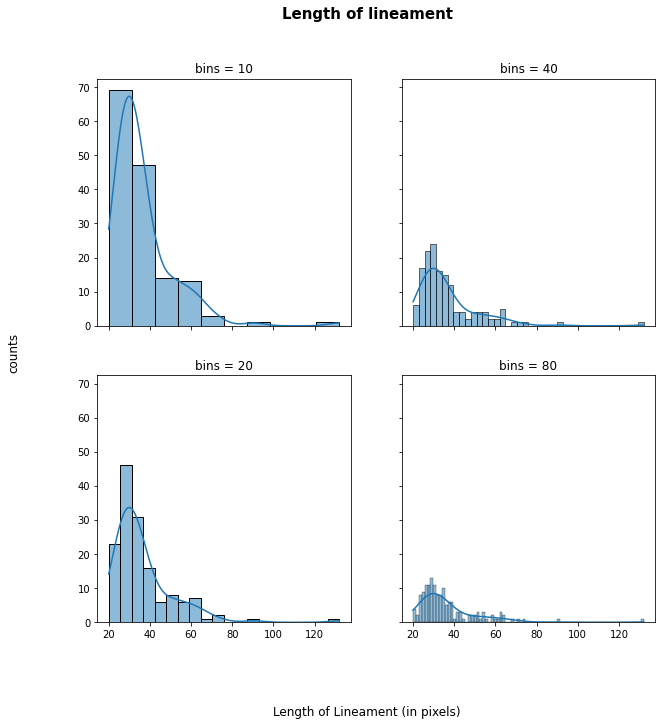

In [109]:
f_his1, axes = plt.subplots(2, 2, figsize=(10, 10),sharex=True, sharey=True)

sns.histplot(df_tot['len'], kde=True,ax=axes[0,0],bins=10)
axes[0,0].set_title("bins = 10")
sns.histplot(df_tot['len'], kde=True,ax=axes[1,0],bins=20)
axes[1,0].set_title("bins = 20")
sns.histplot(df_tot['len'], kde=True,ax=axes[0,1],bins=40)
axes[0,1].set_title("bins = 40")
sns.histplot(df_tot['len'], kde=True,ax=axes[1,1],bins=80)
axes[1,1].set_title("bins = 80")

# make title and subtitles
#f_hist1.set_title('Fault strike orientation distribution',fontsize='large',ha='center',fontweight='bold')
f_his1.suptitle('Length of lineament',fontsize='15',ha='center',fontweight='bold')
plt.setp(axes, xlabel='', ylabel='')

f_his1.text(0.5, 0.0, 'Length of Lineament (in pixels)', ha='center', va='center', fontsize=12)
f_his1.text(0.0, 0.5, 'counts', ha='left', va='center', rotation='vertical', fontsize=12)


Text(0.0, 0.5, 'counts')

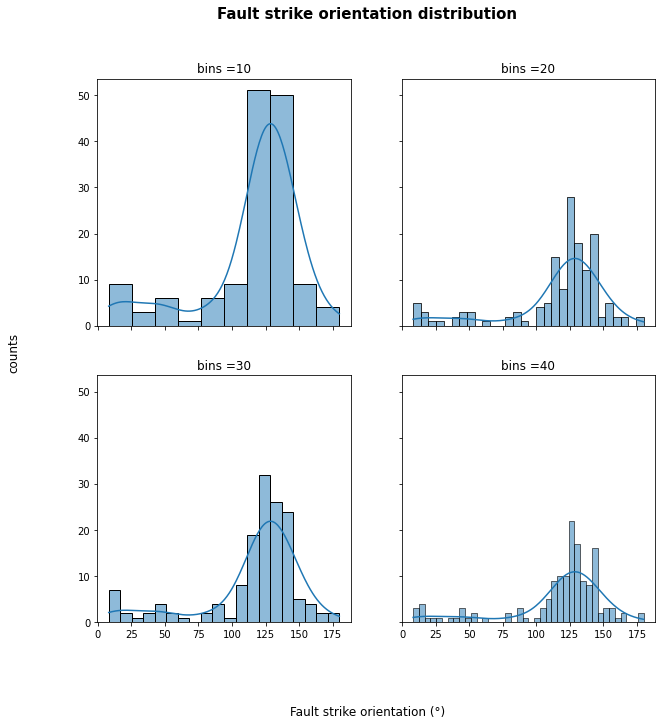

In [110]:
f_his1, axes = plt.subplots(2, 2, figsize=(10, 10),sharex=True, sharey=True)

sns.histplot(df_tot['fault strike'], kde=True,ax=axes[0,0],bins=10)
axes[0,0].set_title("bins =10")
sns.histplot(df_tot['fault strike'], kde=True,ax=axes[1,0],bins=20)
axes[0,1].set_title("bins =20")
sns.histplot(df_tot['fault strike'], kde=True,ax=axes[0,1],bins=30)
axes[1,0].set_title("bins =30")
sns.histplot(df_tot['fault strike'], kde=True,ax=axes[1,1],bins=40)
axes[1,1].set_title("bins =40")

# make title and subtitles
#f_hist1.set_title('Fault strike orientation distribution',fontsize='large',ha='center',fontweight='bold')
f_his1.suptitle('Fault strike orientation distribution',fontsize='15',ha='center',fontweight='bold')
plt.setp(axes, xlabel='', ylabel='')
f_his1.text(0.5, 0.0, 'Fault strike orientation (°)', ha='center', va='center', fontsize=12)
f_his1.text(0.0, 0.5, 'counts', ha='left', va='center', rotation='vertical', fontsize=12)


In [111]:
# Alternative to Histogram
strikes = df_tot['fault strike']

bin_edges = np.arange(-5, 366, 10)
number_of_strikes, bin_edges = np.histogram(strikes, bin_edges)
number_of_strikes[0] += number_of_strikes[-1]
half = np.sum(np.split(number_of_strikes[:-1], 2), 0)
two_halves = np.concatenate([half, half])

Text(0.5, 1.1, 'Rose Diagram of the "Fault System"')

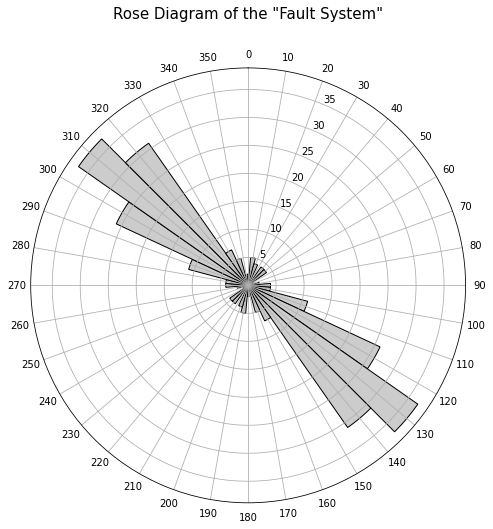

In [112]:
fig = plt.figure(figsize=(16,8))
ax = fig.add_subplot(111, projection='polar')

ax.bar(np.deg2rad(np.arange(0, 360, 10)), two_halves, 
       width=np.deg2rad(10), bottom=0.0, color='.8', edgecolor='k')
ax.set_theta_zero_location('N')
ax.set_theta_direction(-1)
ax.set_thetagrids(np.arange(0, 360, 10), labels=np.arange(0, 360, 10))
#ax.set_rgrids(np.arange(1, two_halves.max() + 1, 2), angle=0, weight= 'black')
ax.set_title('Rose Diagram of the "Fault System"', y=1.10, fontsize=15)

In [113]:
import cmath
import numpy as np
import scipy.stats as stats

# Circular mean of angle data(default to degree)
a = np.deg2rad(df_tot['fault strike'])
angles_complex = np.frompyfunc(cmath.exp, 1, 1)(a * 1j)
mean = cmath.phase(angles_complex.sum()) % (2 * np.pi)
print("Circular mean")
print(np.rad2deg(mean))

Circular mean
120.05364148174081


In [114]:
# Circular variance of angle data(default to degree)
r =abs(angles_complex.sum()) / len(df_tot['fault strike'])
print("Circular Variance:")
print("1 - R=",1-r)
print("R=",r)

Circular Variance:
1 - R= 0.17386877192866068
R= 0.8261312280713393


#Export data to csv file

In [115]:
# Store lines values to csv file
with open('/content/drive/MyDrive/CSV_tables/1515_HoughTest.csv', 'w') as f:
  fwriter = csv.writer(f,delimiter=';')

  for i in linesP:
      a = []
      for j in range(0,4,1):
        #print(i[0][j])
        a.append(i[0][j])
      fwriter.writerow(a)
      #print(np.shape(i))
      #break
  f.close()


# Origi_HoughTest -> 3600 lineament
# 55_HoughTest -> 178 lineament
# 99_HoughTest -> 329 lineament
# 1515_HoughTest -> 148 lineament